### For the best experience, view this notebook on nbviewer:
[Open in nbviewer](https://nbviewer.org/github/ArturKosma/Learning/blob/main/jupyter/ai_for_games/exercises_3.18.ipynb)

In [1]:
import leqanimlib
import leqmath
import numpy as np

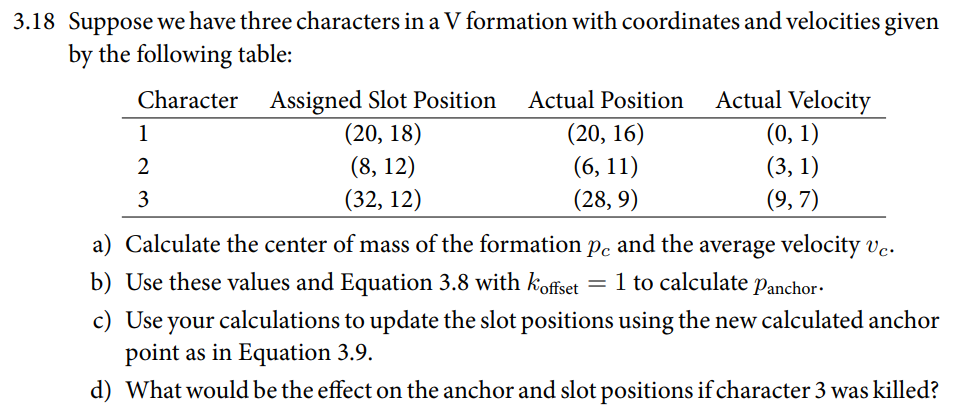

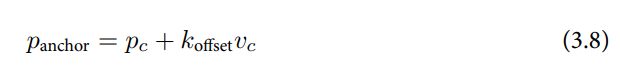

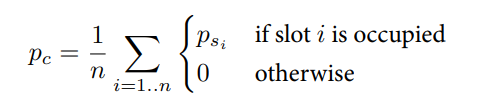

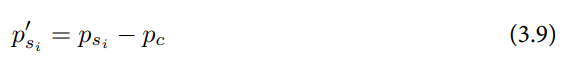

In [2]:
ex3_18 = leqanimlib.leqanimlib(xlim_max=40, ylim_max=40, title='V formation anchoring', frame_num=180)

max_speed = 9999.0

char1 = ex3_18.add_object(ex3_18.Dot(np.array([0, 0]), display_name='1'))
char1.pos = np.array([20, 16], dtype=float)
char1.vel = np.array([0, 1], dtype=float)
char1.max_speed = max_speed
char1.transform_text_velocity = True

char2 = ex3_18.add_object(ex3_18.Dot(np.array([0, 0]), display_name='2'))
char2.pos = np.array([6, 11], dtype=float)
char2.vel = np.array([3, 1], dtype=float)
char2.max_speed = max_speed
char2.transform_text_velocity = True

char3 = ex3_18.add_object(ex3_18.Dot(np.array([0, 0]), display_name='3'))
char3.pos = np.array([28, 9], dtype=float)
char3.vel = np.array([9, 7], dtype=float)
char3.max_speed = max_speed
char3.transform_text_velocity = True

anchor = ex3_18.add_object(ex3_18.Dot(np.array([0, 0], dtype=float), display_name='anchor', color='red'))
anchor.arrow_enabled = False

char1_slot = ex3_18.add_object(ex3_18.Dot(np.array([20, 18], dtype=float), display_name='1slot', color='green'))
char1_slot.arrow_enabled = False
char2_slot = ex3_18.add_object(ex3_18.Dot(np.array([8, 12], dtype=float), display_name='2slot', color='green'))
char2_slot.arrow_enabled = False
char3_slot = ex3_18.add_object(ex3_18.Dot(np.array([32, 12], dtype=float), display_name='3slot', color='green'))
char3_slot.arrow_enabled = False

# Init anchor.
center_of_mass_slots = (char1_slot.pos + char2_slot.pos + char3_slot.pos) / 3
anchor.pos = center_of_mass_slots

# Cache the slot offsets.
char1_slot_offset = char1_slot.pos - anchor.pos
char2_slot_offset = char2_slot.pos - anchor.pos
char3_slot_offset = char3_slot.pos - anchor.pos

def tick_ex3_18(t):
    
    center_of_mass = (char1.pos + char2.pos + char3.pos) / 3
    average_velocity = (char1.vel + char2.vel + char3.vel) / 3
    k_offset = 1.0

    # Update anchor.
    anchor.pos = center_of_mass + (k_offset * average_velocity)

    # Update the slot positions (targets for chars).
    char1_slot.pos = anchor.pos + char1_slot_offset
    char2_slot.pos = anchor.pos + char2_slot_offset
    char3_slot.pos = anchor.pos + char3_slot_offset

    # Update characters velocities.
    char1.vel = char1_slot.pos - char1.pos
    char2.vel = char2_slot.pos - char2.pos
    char3.vel = char3_slot.pos - char3.pos

ex3_18.draw(tick_ex3_18)

I'm having some serious troubles understanding the concept of drift offset from the book. 